# Introduction to Computer Vision: Plant Seedlings Classification

## Problem Statement

### Context

In recent times, the field of agriculture has been in urgent need of modernizing, since the amount of manual work people need to put in to check if plants are growing correctly is still highly extensive. Despite several advances in agricultural technology, people working in the agricultural industry still need to have the ability to sort and recognize different plants and weeds, which takes a lot of time and effort in the long term. The potential is ripe for this trillion-dollar industry to be greatly impacted by technological innovations that cut down on the requirement for manual labor, and this is where Artificial Intelligence can actually benefit the workers in this field, as **the time and energy required to identify plant seedlings will be greatly shortened by the use of AI and Deep Learning.** The ability to do so far more efficiently and even more effectively than experienced manual labor, could lead to better crop yields, the freeing up of human inolvement for higher-order agricultural decision making, and in the long term will result in more sustainable environmental practices in agriculture as well.


### Objective & Problem Definition

**Objective:**
The objective of this project is to develop an AI-powered system that can accurately and efficiently identify plant seedlings. This will reduce the need for manual labor in identifying plants and weeds, freeing up human resources for more complex tasks. By improving the efficiency of plant identification, this project aims to contribute to better crop yields, more informed decision-making.

**Problem Definition:**

The agricultural industry faces a significant challenge in the time-consuming and labor-intensive process of manually identifying and classifying plant seedlings. This manual approach can lead to inefficiencies, potential errors, and limitations in scalability. The problem is further compounded by the need for rapid and accurate identification to optimize crop management and ensure healthy plant growth.

Therefore, the core problem this project addresses is the **development of an automated and accurate system for plant seedling identification**, leveraging the power of AI and deep learning to overcome the limitations of manual classification and enhance efficiency in the agricultural field.

### Data Dictionary

The Aarhus University Signal Processing group, in collaboration with the University of Southern Denmark, has recently released a dataset containing **images of unique plants belonging to 12 different species.**

- The dataset can be download from Olympus.
- The data file names are:
    - images.npy
    - Labels.csv
- Due to the large volume of data, the images were converted to the images.npy file and the labels are also put into Labels.csv, so that you can work on the data/project seamlessly without having to worry about the high data volume.

- The goal of the project is to create a classifier capable of determining a plant's species from an image.

**List of Species**

- Black-grass
- Charlock
- Cleavers
- Common Chickweed
- Common Wheat
- Fat Hen
- Loose Silky-bent
- Maize
- Scentless Mayweed
- Shepherds Purse
- Small-flowered Cranesbill
- Sugar beet

### **Note: Please use GPU runtime on Google Colab to execute the code faster.**

## Importing necessary libraries

In [121]:
# Installing the libraries with the specified version.
# Google Colab is being used

!pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 opencv-python==4.8.0.76 -q --user

In [122]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install tensorflow==2.13.0 scikit-learn==1.2.2 seaborn==0.11.1 matplotlib==3.3.4 numpy==1.24.3 pandas==1.5.2 opencv-python==4.8.0.76 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [123]:
import os
import numpy as np                                                                               # Importing numpy for Matrix Operations
import pandas as pd                                                                              # Importing pandas to read CSV files
import matplotlib.pyplot as plt                                                                  # Importting matplotlib for Plotting and visualizing images
import math                                                                                      # Importing math module to perform mathematical operations
import cv2                                                                                       # Importing openCV for image processing
import seaborn as sns                                                                            # Importing seaborn to plot graphs


# Tensorflow modules
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator                              # Importing the ImageDataGenerator for data augmentation
from tensorflow.keras.models import Sequential                                                   # Importing the sequential module to define a sequential model
from tensorflow.keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D,BatchNormalization # Defining all the layers to build our CNN Model
from tensorflow.keras.optimizers import Adam,SGD                                                 # Importing the optimizers which can be used in our model
from sklearn import preprocessing                                                                # Importing the preprocessing module to preprocess the data
from sklearn.model_selection import train_test_split                                             # Importing train_test_split function to split the data into train and test
from sklearn.metrics import confusion_matrix                                                     # Importing confusion_matrix to plot the confusion matrix

# Display images using OpenCV
from google.colab.patches import cv2_imshow                                                      # Importing cv2_imshow from google.patches to display images

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

## Loading the dataset

In [124]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [125]:
# Load the image file of dataset
images = np.load('/content/drive/MyDrive/PGP-AIML/Machine Learning/Project5-ComputerVision-PlantSeeding/images.npy')

# Load the label file of dataset
labels = pd.read_csv('/content/drive/MyDrive/PGP-AIML/Machine Learning/Project5-ComputerVision-PlantSeeding/Labels.csv')

## Data Overview

### Understand the shape of the dataset

In [126]:
print(images.shape)
print(labels.shape)

(4750, 128, 128, 3)
(4750, 1)


### Summary
* There are 4750 Colored (RGB) images of 128X128 pixels each.
* As this is a colored image, there are three channels for each of RBG colors.
* The Labels.csv contains the labels for all the 4750 images.

## Exploratory Data Analysis

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you understand the data better.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

In [127]:
def plot_images(images,labels):
  num_classes=10                                                                  # Number of Classes
  categories=np.unique(labels)
  keys=dict(labels['Label'])                                                      # Obtaing the unique classes from y_train
  rows = 3                                                                        # Defining number of rows=3
  cols = 6                                                                        # Defining number of columns=4
  fig = plt.figure(figsize=(15, 8))                                               # Defining the figure size to 10x8
  for i in range(cols):
      for j in range(rows):
          random_index = np.random.randint(0, len(labels))                        # Generating random indices from the data and plotting the images
          ax = fig.add_subplot(rows, cols, i * rows + j + 1)                      # Adding subplots with 3 rows and 4 columns
          ax.imshow(images[random_index, :])                                      # Plotting the image
          ax.set_title(keys[random_index])
  plt.show()

In [128]:
species_column_name = 'Label'
species_names = labels[species_column_name].unique()
print(species_names)
number_of_species = len(species_names)
print(f"\nNumber of plant categories: {number_of_species}")

['Small-flowered Cranesbill' 'Fat Hen' 'Shepherds Purse' 'Common wheat'
 'Common Chickweed' 'Charlock' 'Cleavers' 'Scentless Mayweed' 'Sugar beet'
 'Maize' 'Black-grass' 'Loose Silky-bent']

Number of plant categories: 12


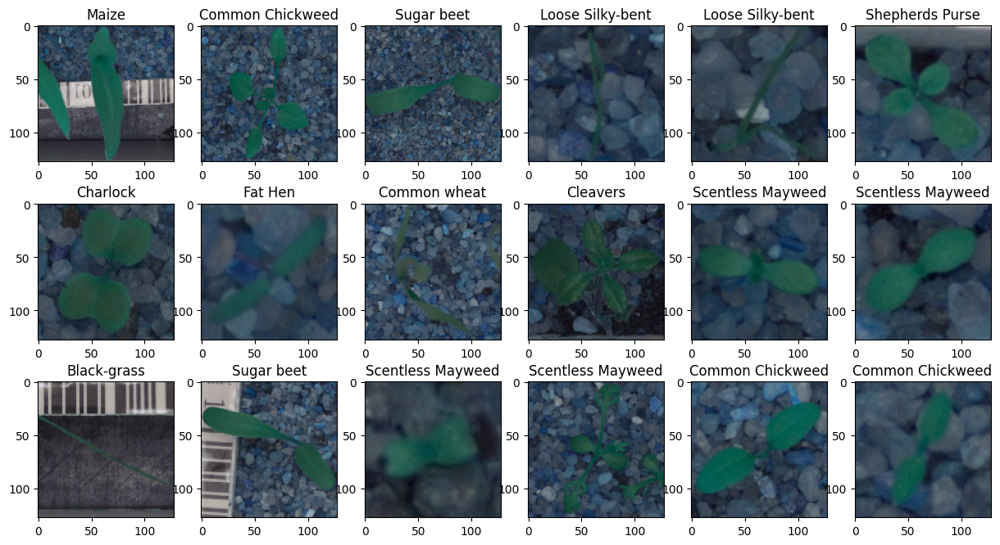

In [129]:
# Displaying sample images of the plants
plot_images(images,labels)

In [130]:
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import numpy as np

def display_sample_grid(images, labels, species_names, num_rows=12, num_cols=10):
    """Displays a grid of sample images, with each row representing a species."""

    num_categ = len(species_names)

    # Define figure with a bit extra width for the labels
    fig = plt.figure(figsize=(18, 14))  # Increased width to accommodate labels

    # Create a grid with an extra column for labels
    grid = ImageGrid(fig, 111,
                    nrows_ncols=(num_categ, num_cols + 1),  # Add an extra column
                    axes_pad=0.05)

    i = 0

    # Plotting num_cols images from each plant category
    for category_id, category in enumerate(species_names):
        condition = labels["Label"] == category
        plant_indices = labels.index[condition].tolist()

        # Plot images for the current row
        for j in range(num_cols):
            ax = grid[i]
            if plant_indices:  # Check if there are any images for this category
                index = np.random.choice(plant_indices)
                ax.imshow(images[index])
            ax.axis('off')
            i += 1

        # Add label in the last column of the row
        ax = grid[i]
        ax.axis('off')  # Turn off the axis
        ax.text(0.1, 0.5, category,
                verticalalignment='center',
                horizontalalignment='left',
                color='black',
                fontsize=14,
                fontweight='bold',
                transform=ax.transAxes)  # Use axis coordinates
        i += 1

    plt.tight_layout()
    plt.show()


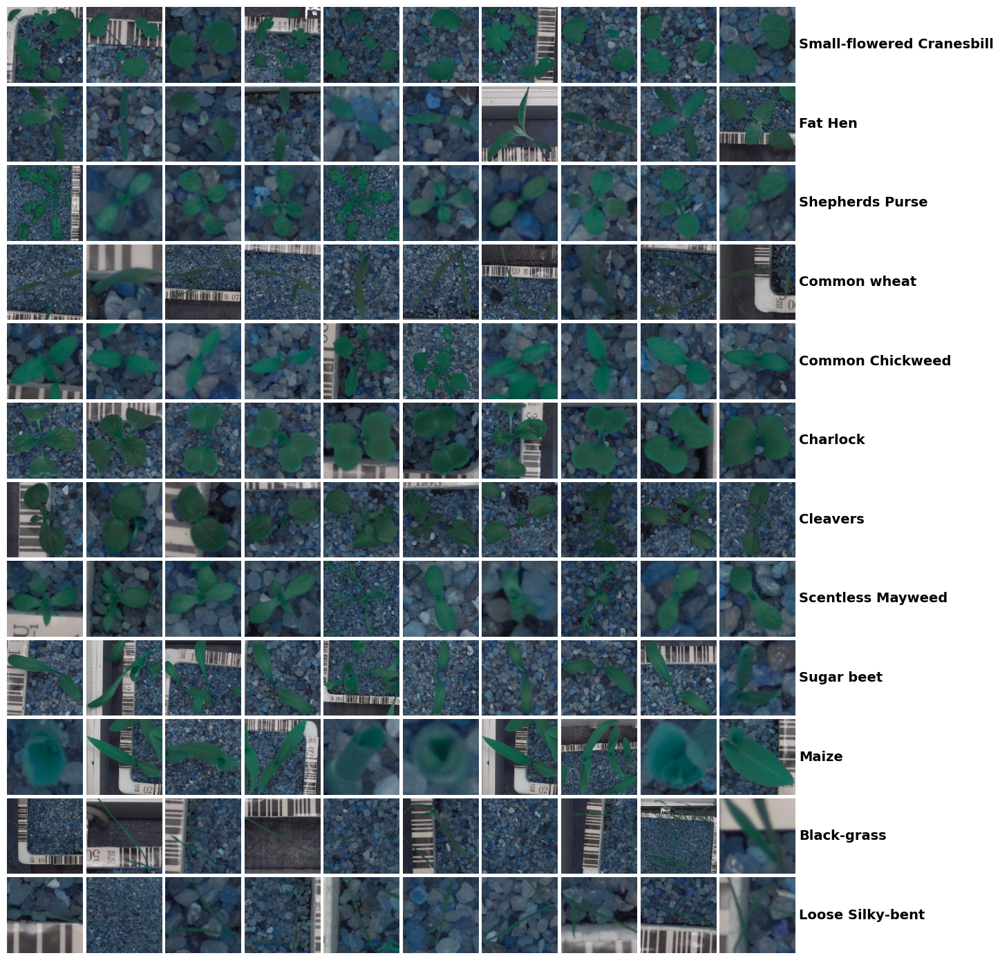

In [131]:
display_sample_grid(images, labels, species_names)

In [132]:
labels['Label'].value_counts()

,count
Label,
Loose Silky-bent,654
Common Chickweed,611
Scentless Mayweed,516
Small-flowered Cranesbill,496
Fat Hen,475
Charlock,390
Sugar beet,385
Cleavers,287
Black-grass,263


Text(0.5, 1.0, 'Plant Species Distribution in Dataset')

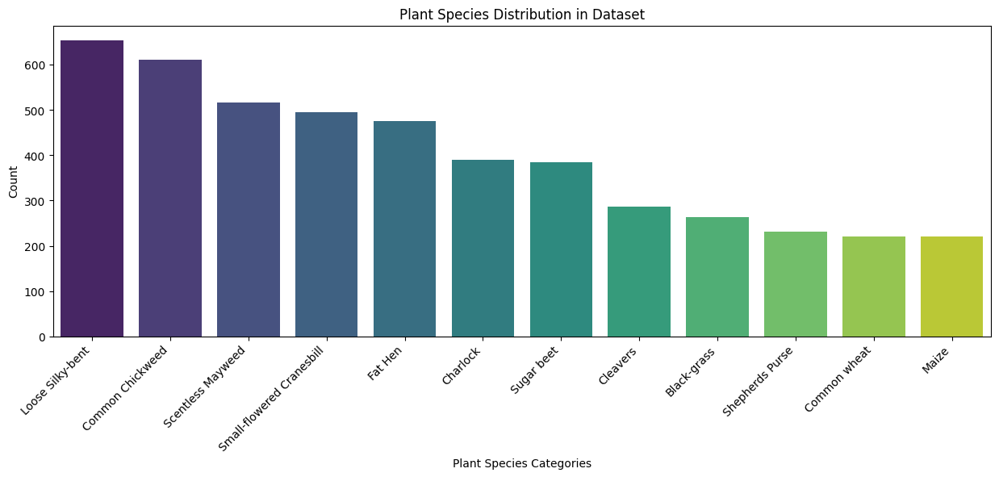

In [133]:
plt.rcParams["figure.figsize"] = (15,5)
sns.countplot(x=labels.iloc[:,-1],order = labels['Label'].value_counts().index, palette='viridis')
plt.xticks(rotation=45, ha="right")
plt.xlabel("Plant Species Categories")
plt.ylabel("Count")
plt.title("Plant Species Distribution in Dataset")

### **Summary of EDA**

Observations:
*  The plot_images(images, labels) function is written to visually explore the dataset by displaying sample images alongside their corresponding labels. This method helps in:

  *  Understanding the data distribution: By viewing images from each plant species, we can check if the data is balanced or imbalanced across classes.
  *  Identifying data quality: It allows us to spot any issues like blurry images, incorrect labels, or unexpected artifacts.

*  Number of plant categories: 12. So, the output classess therefore will be 12

*  display_sample_grid(images, labels, species_names) function displays a martix of 12X10 showing sample simages of each of the 12 plants with theri lable. with the label as the last column, will help you analyze & identify the plant characteristics



Questions:

**1. How are these different category plant images different from each other?**

While its not easy to make out significant differences just looking at the images, here are few of the oservations

  *  **Small-flowered Cranesbill (Row 1):**

    *  Features distinctive rounded leaves , looks somewhat like small maple leaves)
    *  Leaves grow in clusters with a radial pattern
    *  Each leaf has 5-7 defined segments with slightly toothed edges
    *  Forms compact clumps on the ground

  *  **Fat Hen (Row 2):**

    *  Has broader, more diamond or triangular-shaped leaves
    *  Leaves are less deeply lobed and more solid in shape
    *  Shows more variation in leaf sizes within the same plant
    *  Some leaves appear to have a slight mealy or dusty texture


*  **Shepherds Purse (Row 3):**

  *  Characterized by a basal rosette growth form in early stages
  *  Leaves are more elongated with irregular, shallow lobing
  *  Has a more compact, clustered growth habit
  *  Leaf edges have small, irregular notches


*  **Common Wheat (Row 4):**

  *  Displays narrow, elongated grass-like leaves
  *  Has a distinct linear structure with parallel veins
  *  Grows more upright compared to the other plants
  *  Lacks the broad leaf blade structure of the other species

*  **Common Chickweed (Row 5):**

    *  Features small, oval to egg-shaped leaves
    *  Leaves grow in opposite pairs along slender stems
    *  Has a spreading, mat-forming growth habit
    *  Leaves have smooth edges and pointed tips


**2. Is the dataset provided an imbalance? (Check with using bar plots)**

  *  Based on the counts of each plant species, the bar plots above, it is clear that the dataset is indeed imbalanced.
  *  Unequal Distribution: The number of samples for each plant species varies significantly. For example, 'Loose Silky-bent' has 654 samples, while 'Maize' has only 221.
  *  Dominant Species: "Loose Silky-bent" has the highest number of images in the dataset, followed closely by "Common Chickweed." These two species are significantly more represented than the others.
  *  Minority Species: "Common wheat" and "Maize" have the lowest number of images, indicating they are the least represented species in the dataset.
  *  Dominant Classes: classes like 'Loose Silky-bent', 'Common Chickweed' have considerably more samples than others, potentially leading to a bias towards these dominant classes during model training.
  *  Accuracy can be misleading with imbalanced datasets. Even if the model predicts the dominant class well, it might perform poorly on the less frequent classes



## Data Pre-Processing

### Convert the BGR images to RGB images.



**Why Convert BGR to RGB?**

Different libraries and tools use different color formats, which can lead to color inconsistencies if not handled correctly.

* **OpenCV (BGR):** OpenCV, a popular computer vision library, loads images in BGR format by default — the blue channel comes first, then green, and finally red.
* **Matplotlib, PIL, etc. (RGB):** Many other libraries like Matplotlib, PIL (Pillow), and TensorFlow use the RGB format, where red comes first, then green, and blue last.

If you don't convert between the two formats when needed, colors may appear incorrectly — for example, what should be red might appear as blue.

**When to Convert:**

* **Displaying images with Matplotlib:** Convert BGR to RGB to show correct colors.
* **Saving or processing images:** Depending on the target library, you may need the right format.


In [134]:
# Converting the images from BGR to RGB using cvtColor function of OpenCV
for i in range(len(images)):
  images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)

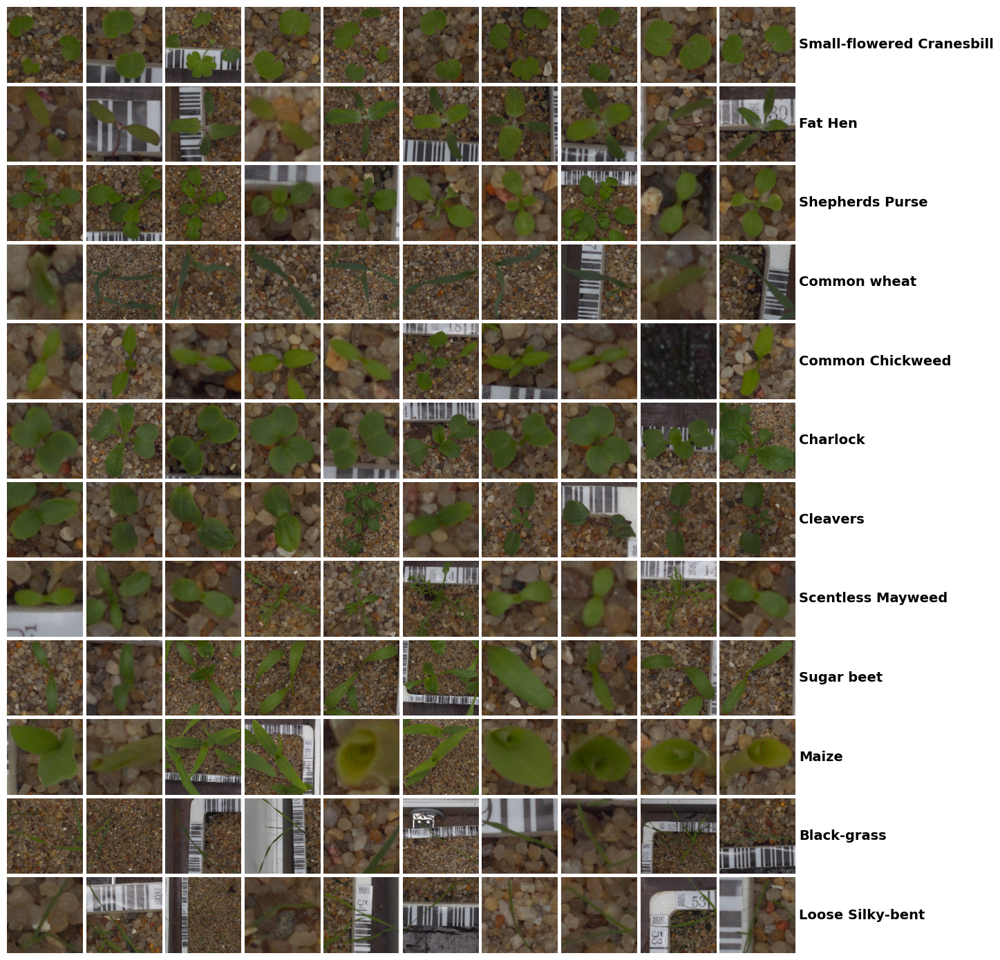

In [135]:
display_sample_grid(images, labels, species_names)

### Resize the images

**Why Resize Images?**

Resizing images is a crucial step in many computer vision and machine learning tasks for several reasons:

**Consistency in Input Size:**

* Most machine learning models (like CNNs) expect inputs of a fixed size.
* Resizing ensures all images have the same dimensions, preventing shape mismatches during model training or inference.

**Memory and Computational Efficiency:**

* Large images require more memory and processing power.
* Resizing reduces the number of pixels, speeding up training and inference without overwhelming hardware.

As the size of the images changing the image size from 128 to 64.

In [136]:
images_decreased=[]
height = 64
width = 64
dimensions = (width, height)
for i in range(len(images)):
  images_decreased.append( cv2.resize(images[i], dimensions, interpolation=cv2.INTER_LINEAR))

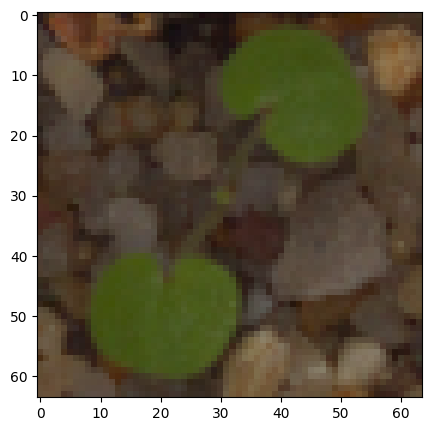

In [137]:
# Sample image of a resized image
plt.imshow(images_decreased[5])

Displaying the images after they were resized

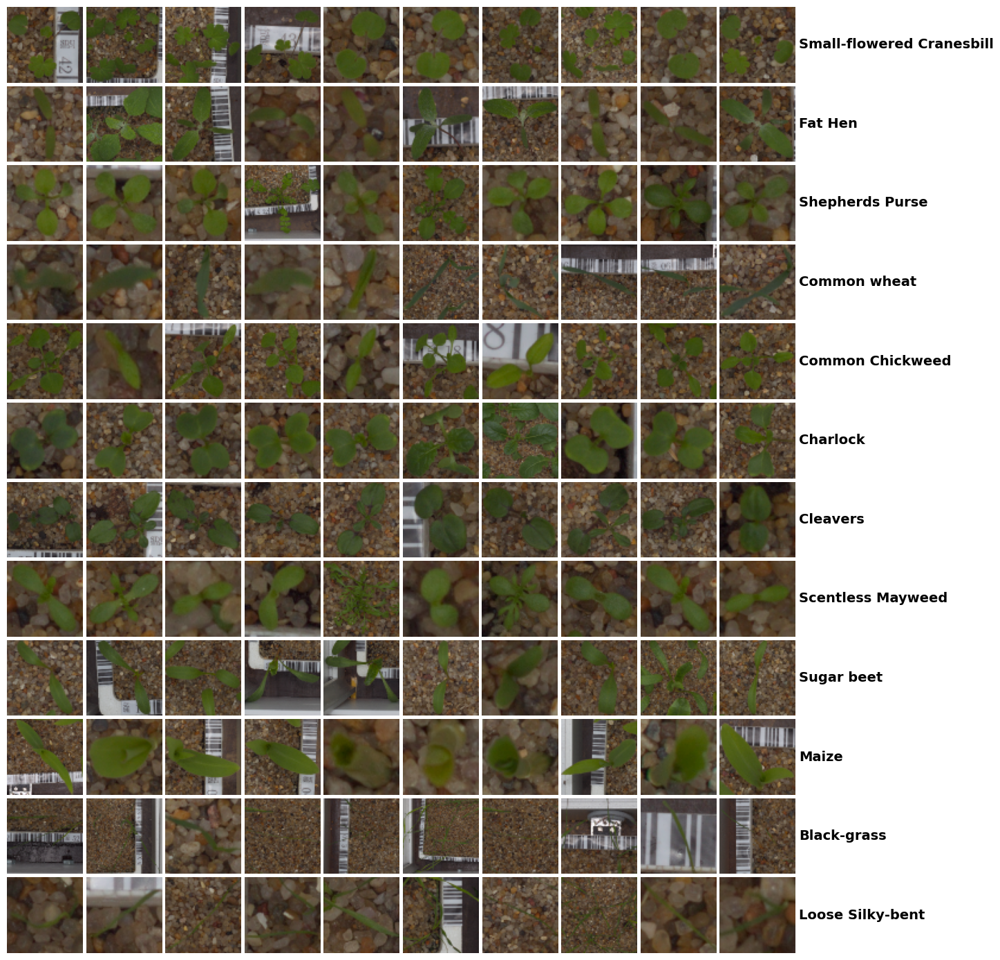

In [138]:
display_sample_grid(images_decreased, labels, species_names)

### Data Preparation for Modeling

- Before building a model, you need to split the data into train, validation & test to be able to evaluate the model.
  *  The training set is used to train the model by helping it learn patterns in the data.
  *  The validation set is used to tune hyperparameters and prevent overfitting
  *  The test set evaluates the model's performance on unseen data
- Encode categorical features and scale the pixel values.
- Build a model using the train data and then check its performance

#### Split the dataset


*  Using train_test_split() function from scikit-learn, we will split the dataset into three parts: Train, Test and Validation.
*  We will use 10% of our data for testing, 10% of our data for validation and 80% of our data for training.


In [139]:
from sklearn.model_selection import train_test_split
X_temp, X_test, y_temp, y_test = train_test_split(np.array(images_decreased),labels , test_size=0.1, random_state=42,stratify=labels)
X_train, X_val, y_train, y_val = train_test_split(X_temp,y_temp , test_size=0.1, random_state=42,stratify=y_temp)

In [140]:
# Calculate percentages
total_samples = len(images_decreased)
train_percentage = len(X_train) / total_samples * 100
val_percentage = len(X_val) / total_samples * 100
test_percentage = len(X_test) / total_samples * 100

# Print shapes and percentages
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}, Percentage: {train_percentage:.2f}%")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}, Percentage: {val_percentage:.2f}%")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}, Percentage: {test_percentage:.2f}%")

X_train shape: (3847, 64, 64, 3), y_train shape: (3847, 1), Percentage: 80.99%
X_val shape: (428, 64, 64, 3), y_val shape: (428, 1), Percentage: 9.01%
X_test shape: (475, 64, 64, 3), y_test shape: (475, 1), Percentage: 10.00%


#### Encode the target labels

The goal of this code is to convert your categorical labels (plant species names) into a numerical format suitable for machine learning models, specifically in a "one-hot" encoded representation

Since there are 12 different plant species. LabelBinarizer will do the following:
*  Create 12 columns, one for each species
*  Example , If the sample belongs to species "Common Wheat," it will put a 1 in the column for species "Common Wheat" and 0s in all other columns.


In [141]:
# Convert labels from names to one hot vectors.
from sklearn.preprocessing import LabelBinarizer
enc = LabelBinarizer()
y_train_encoded = enc.fit_transform(y_train)
y_val_encoded=enc.transform(y_val)
y_test_encoded=enc.transform(y_test)

In [142]:
# Visualize the data after encoding
print(y_train_encoded[:5])
print(y_train_encoded.shape)

[[0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0]]
(3847, 12)


#### Data Normalization

Data normalization is a preprocessing technique that scales numerical data to a specific range, typically between 0 and 1 or -1 and 1. In the context of images, normalization involves adjusting the pixel values.

**Common Normalization Techniques for Images:**

*  Min-Max Scaling (0 to 1): Scales pixel values to the range [0, 1].
*  Standardization (Z-score Normalization): Scales pixel values to have a mean of 0 and a standard deviation of 1.
*  Pixel Value Division (0 to 1): Divides pixel values by the maximum possible value (e.g., 255 for 8-bit images).

*  Since the image pixel values range from 0-255, our method of normalization here will be Pixel value division - we shall divide all the pixel values by 255 to standardize the images to have values between 0-1.

In [143]:
# Normalizing the image pixels
X_train_normalized = X_train.astype('float32')/255.0
X_val_normalized = X_val.astype('float32')/255.0
X_test_normalized = X_test.astype('float32')/255.0

## Model Building

### Model Building - Convolutional Neural Network (CNN)


We will now construct a Convolutional Neural Network (CNN) designed for image classification. This model will consist of two primary components: 1) **Feature Extraction Layers**, which utilize convolutional and pooling operations to learn hierarchical features from the input images, and 2) **Fully Connected Classification Layers**, which will process the extracted features to produce the final species predictions.


*  We'll build a Convolutional Neural Network (CNN) model using Keras' sequential approach, adding layers one by one.
*  To ensure a clean slate for each training run, clear any existing model history from the Keras session. This is essential to prevent unintended carryover from previous model runs
*  Fix the Seed to 42

In [144]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

In [145]:
# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [146]:
# Utility method to display the Model accuracy graph for Training v/s Validation set.
def model_evaluation(model_history):

  plt.plot(model_history.history['accuracy'])
  plt.plot(model_history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='upper left')
  plt.show()

**CNN Concepts - Keras:**

*  Conv2D: This is a function in Keras that creates a 2D convolutional layer
*  `Conv2D(128, (3, 3))` creates a convolutional layer where:

* Each of the 128 filters is responsible for detecting a particular pattern or feature.
* The 3×3 kernels scan the input, performing element-wise multiplication and summation.
* These filters might learn to identify various low to mid-level features such as edges, textures, color transitions, or more complex patterns depending on the layer's depth in the network.
* Each filter produces one feature map in the output, so this layer transforms its input into 128 feature maps. Early in a network, these might represent simple visual elements (edges, corners, etc.), while deeper in the network, they could represent more abstract or complex visual concepts.

*  The input_shape=(64, 64, 3) part of this code specifies the dimensions of the input images that will be fed into your convolutional neural network.
*  The "same" padding ensures that the output feature maps will have the same spatial dimensions as the input (still 64×64), which helps preserve spatial information at the boundaries.
*  The first convolutional layer processes this 64×64×3 input and produces 128 feature maps, each also 64×64 in size (because of the "same" padding).

*  For plant classification model, Its good to use Adam optimizer over SGD, as Adam adjusts learning rates automatically for each parameter. For most image classification tasks, Adam typically converges more quickly than SGD,

#### Model 1: CNN Basic - Conv2D & MaxPool (2) - Relu-Softmax-Adam

This model uses the original data without any data augmentation

In [147]:
# Intializing a sequential model
model1 = Sequential()

# Adding first conv layer with 128 filters and kernel size 3x3 , padding 'same' provides the output size same as the input size
# Input_shape denotes input image dimension of images
model1.add(Conv2D(128, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))

# Adding max pooling to reduce the size of output of first conv layer
model1.add(MaxPooling2D((2, 2), padding = 'same'))

# Creating two similar convolution and max-pooling layers
model1.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model1.add(MaxPooling2D((2, 2), padding = 'same'))

model1.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model1.add(MaxPooling2D((2, 2), padding = 'same'))

# flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model1.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model1.add(Dense(16, activation='relu'))
model1.add(Dropout(0.3))
# Adding the output layer with 10 neurons and activation functions as softmax since this is a multi-class classification problem
model1.add(Dense(12, activation='softmax'))

# Refer the Notes in the ealrier section on why Adam was choosen
# Using SGD Optimizer
# opt = SGD(learning_rate=0.01, momentum=0.9)
opt=Adam()
# Compile model
model1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │          32,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 128,828 (503.23 KB)

 Trainable params: 128,828 (503.23 KB)

 Non-trainable params: 0 (0.00 B)

**Fitting the model on the train dataset**

In [148]:
history_1 = model1.fit(
            X_train_normalized, y_train_encoded,
            epochs=30,
            validation_data=(X_val_normalized,y_val_encoded),
            batch_size=32,
            verbose=2
)

Epoch 1/30
121/121 - 6s - 46ms/step - accuracy: 0.1183 - loss: 2.4685 - val_accuracy: 0.1168 - val_loss: 2.4486
Epoch 2/30
121/121 - 1s - 5ms/step - accuracy: 0.1986 - loss: 2.3129 - val_accuracy: 0.3178 - val_loss: 2.0994
Epoch 3/30
121/121 - 1s - 5ms/step - accuracy: 0.2683 - loss: 2.0969 - val_accuracy: 0.3481 - val_loss: 1.8788
Epoch 4/30
121/121 - 1s - 5ms/step - accuracy: 0.2867 - loss: 1.9794 - val_accuracy: 0.3575 - val_loss: 1.7901
Epoch 5/30
121/121 - 1s - 5ms/step - accuracy: 0.2784 - loss: 1.9445 - val_accuracy: 0.3668 - val_loss: 1.7290
Epoch 6/30
121/121 - 1s - 5ms/step - accuracy: 0.3039 - loss: 1.8983 - val_accuracy: 0.3692 - val_loss: 1.6905
Epoch 7/30
121/121 - 1s - 5ms/step - accuracy: 0.3210 - loss: 1.8415 - val_accuracy: 0.3902 - val_loss: 1.6332
Epoch 8/30
121/121 - 1s - 5ms/step - accuracy: 0.3260 - loss: 1.8358 - val_accuracy: 0.4252 - val_loss: 1.6322
Epoch 9/30
121/121 - 1s - 5ms/step - accuracy: 0.3416 - loss: 1.8059 - val_accuracy: 0.4346 - val_loss: 1.5609


**Model Evaluation**

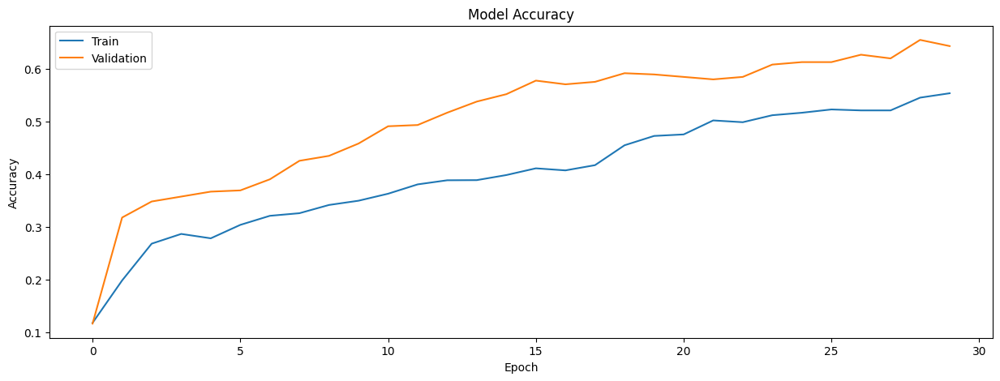

In [149]:
model_evaluation(history_1)

**Evaluating the model on test data**

In [150]:
accuracy = model1.evaluate(X_test_normalized, y_test_encoded, verbose=2)

15/15 - 0s - 26ms/step - accuracy: 0.6632 - loss: 1.0873


**Plotting the Confusion Matrix**

To visually assess our classification model's performance, we'll utilize a confusion matrix. This matrix provides a detailed breakdown of correct and incorrect predictions, categorized by each plant species. Since our true labels (`y_test_encoded`) are one-hot encoded and our predictions (`y_pred`) are probabilities, we must convert both to categorical class labels using `argmax()`. This will allow us to accurately compare predicted and actual species classifications within the confusion matrix.

Note: The Confusion matrix is also defined as an inbuilt function in the TensorFlow module

In [151]:
# Here we would get the output as probablities for each category
y_pred=model1.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


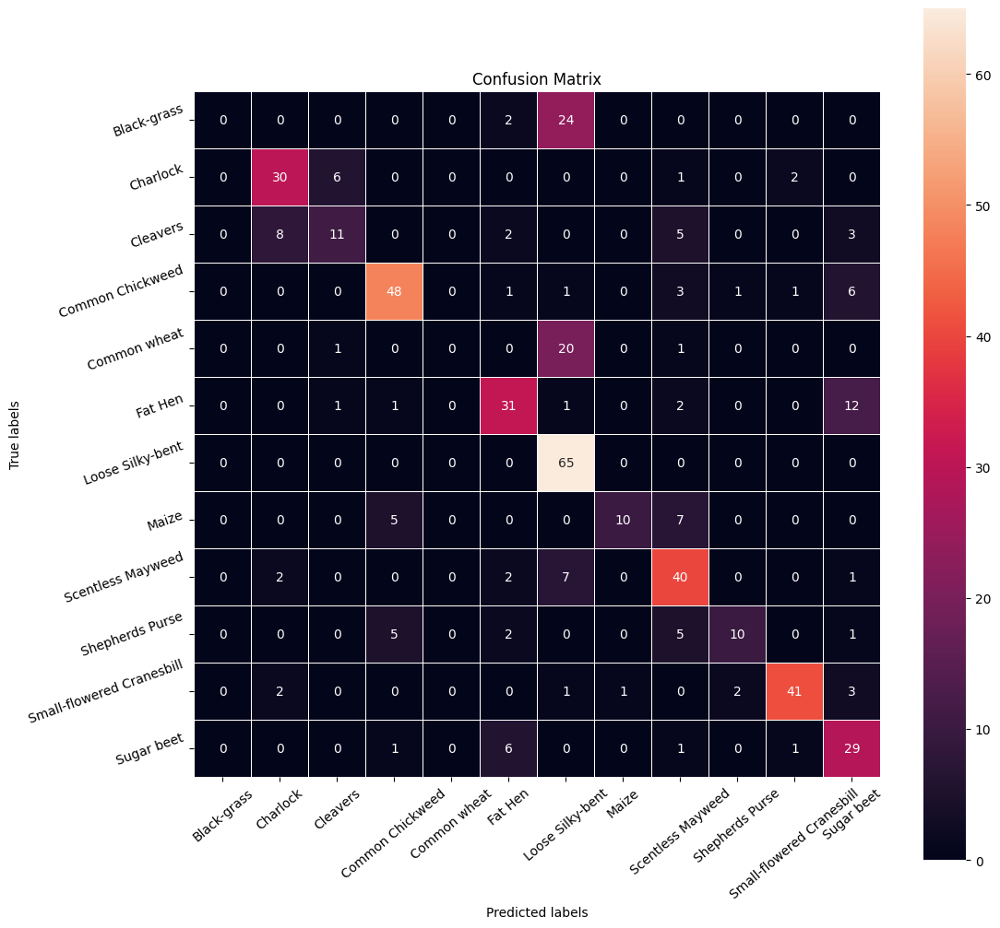

In [152]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=40)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=20)
plt.show()

In [153]:
from sklearn import metrics
#Accuracy as per the classification report
cr=metrics.classification_report(y_test_arg,y_pred_arg)
print(cr)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        26
           1       0.71      0.77      0.74        39
           2       0.58      0.38      0.46        29
           3       0.80      0.79      0.79        61
           4       0.00      0.00      0.00        22
           5       0.67      0.65      0.66        48
           6       0.55      1.00      0.71        65
           7       0.91      0.45      0.61        22
           8       0.62      0.77      0.68        52
           9       0.77      0.43      0.56        23
          10       0.91      0.82      0.86        50
          11       0.53      0.76      0.62        38

    accuracy                           0.66       475
   macro avg       0.59      0.57      0.56       475
weighted avg       0.62      0.66      0.62       475



**Observations from Model - 1**

Looking at the model accuracy graph you've shared, here are the key observations:

1. The validation accuracy (orange line) is consistently higher than the training accuracy (blue line) throughout all epochs.

2. Both training and validation accuracies improve over time, with the model starting at very low accuracy (around 0.15 for training and 0.15-0.20 for validation).

3. The training accuracy gradually increases from about 0.15 to approximately 0.46 by epoch 30.

4. The validation accuracy increases more rapidly at first and plateaus around 0.55-0.58 in the later epochs.

5. There's no sign of overfitting (typically indicated by training accuracy continuing to rise while validation accuracy drops).

6. The gap between training and validation accuracy remains fairly consistent throughout training (approximately 0.1).

7. Both curves show a steady learning pattern without major fluctuations, suggesting stable training.

8. The final model achieves approximately 0.46 training accuracy and 0.55 validation accuracy.

9. The model appears to be still improving slightly at epoch 30, suggesting additional epochs might yield further gains.

This unusual pattern (validation accuracy higher than training) often occurs with regularization techniques like dropout or when the validation set happens to contain easier examples than the training set.

**Model 1 : Observations from Test Data Evaluation**

The model has an accuracy of 70.53%, which indicates that it is performing reasonably well. However, we can see some variations in performance across different classes.

*  Precision :
  *  Class 1 (index 1) has the highest precision of 0.91, indicating that when the model predicts class 1, it is correct 91% of the time.
  *  Class 4 (index 4), however, has a precision of 0.40, which means many false positives for this class.

*  Recall:
  *  Class 6 (index 6) has a recall of 0.97, meaning the model identified 97% of the actual instances of class 6.
  *  class 4 has a recall of only 0.09, meaning the model misses almost all of the actual instances for this class.

*  F1-Score:
  *  Class 1 (index 1) performs well with an F1-score of 0.85
  *  Class 4 has a F1-score of 0.15, showing that this class is severely underperforming.

Class imbalance could be a key factor affecting performance. Y


**Memory Management: Deleting Model and History Variables**

To optimize RAM usage, particularly when training multiple models or working with large datasets, it's essential to release memory occupied by variables that are no longer needed. We will explicitly delete the model and history variables after each training session. This practice ensures that the memory is freed up for subsequent operations, preventing potential memory-related issues and improving overall efficiency.

In [154]:
del model1
del history_1

## Model Performance Improvement

#### Model-2: Conv2D-BathNormalization-MaxPool(3)-128-128

Trying to improve the performance by making these changes:
*  Changing Filter Count & Complexity from Conv2D(64, (3, 3), activation='relu', padding="same") → Conv2D(128, (3, 3), activation='relu', padding="same") in the second and third Conv layers.

*  Adding More Convolution Layers

*  Adding Batch Normalization after each convolutional layer can help in stabilizing and accelerating training by normalizing the activations

In [155]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

model2 = Sequential()

# First Conv Layer with Batch Normalization
model2.add(Conv2D(128, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), padding='same'))

# Second Conv Layer
model2.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), padding='same'))

# Third Conv Layer
model2.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), padding='same'))

# Flatten the result
model2.add(Flatten())

# Fully Connected Dense Layers
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5))

model2.add(Dense(64, activation='relu'))
model2.add(Dropout(0.5))

# Output Layer
model2.add(Dense(12, activation='softmax'))

# Compile the model with Adam optimizer
opt = Adam()
model2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
model2.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 759,692 (2.90 MB)

 Trainable params: 759,052 (2.90 MB)

 Non-trainable params: 640 (2.50 KB)

In [156]:
# Fitting the model on the train data
history_2 = model2.fit(
            X_train_normalized, y_train_encoded,
            epochs=30,
            validation_data=(X_val_normalized,y_val_encoded),
            batch_size=32,
            verbose=2,
            shuffle=True
)

Epoch 1/30
121/121 - 10s - 81ms/step - accuracy: 0.1625 - loss: 2.6694 - val_accuracy: 0.1379 - val_loss: 5.4515
Epoch 2/30
121/121 - 1s - 5ms/step - accuracy: 0.2488 - loss: 2.2545 - val_accuracy: 0.1379 - val_loss: 5.8345
Epoch 3/30
121/121 - 1s - 5ms/step - accuracy: 0.3034 - loss: 2.0880 - val_accuracy: 0.1729 - val_loss: 2.8423
Epoch 4/30
121/121 - 1s - 5ms/step - accuracy: 0.3293 - loss: 1.9820 - val_accuracy: 0.2617 - val_loss: 2.1935
Epoch 5/30
121/121 - 1s - 5ms/step - accuracy: 0.3761 - loss: 1.8373 - val_accuracy: 0.3061 - val_loss: 2.4567
Epoch 6/30
121/121 - 1s - 5ms/step - accuracy: 0.4458 - loss: 1.6580 - val_accuracy: 0.5280 - val_loss: 1.4892
Epoch 7/30
121/121 - 1s - 5ms/step - accuracy: 0.5017 - loss: 1.5055 - val_accuracy: 0.4883 - val_loss: 1.6959
Epoch 8/30
121/121 - 1s - 5ms/step - accuracy: 0.5048 - loss: 1.4746 - val_accuracy: 0.4299 - val_loss: 2.4033
Epoch 9/30
121/121 - 1s - 5ms/step - accuracy: 0.5513 - loss: 1.3608 - val_accuracy: 0.1612 - val_loss: 4.2822

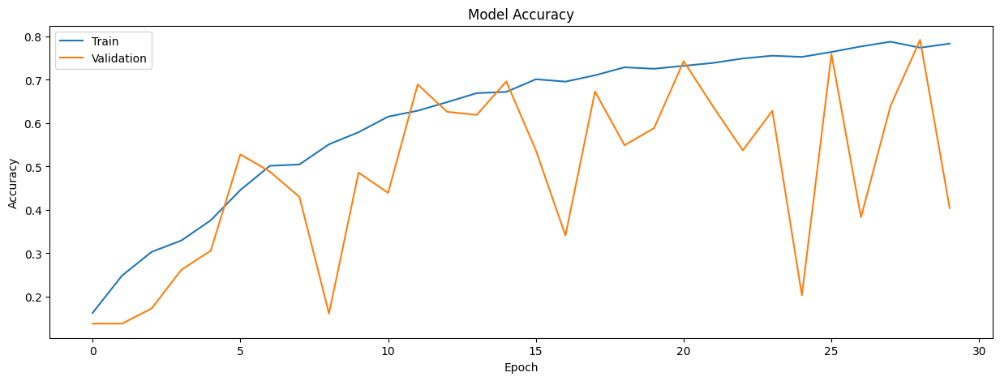

In [157]:
model_evaluation(history_2)

In [158]:
accuracy = model2.evaluate(X_test_normalized, y_test_encoded, verbose=2)

15/15 - 1s - 36ms/step - accuracy: 0.4211 - loss: 2.4822


In [159]:
# Plotting the Confusion Matrix
# Here we would get the output as probablities for each category
y_pred=model2.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step


In [160]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

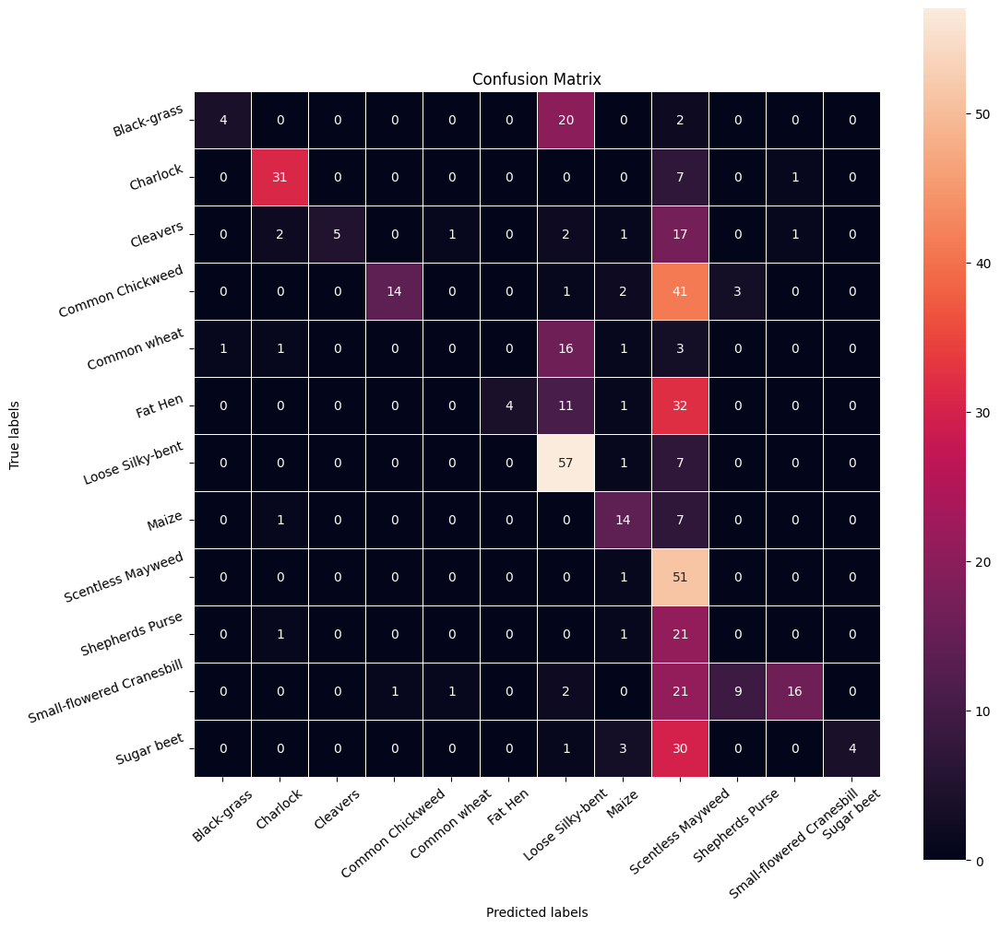

In [161]:
# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=40)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=20)
plt.show()

In [162]:
from sklearn import metrics
#Accuracy as per the classification report
cr=metrics.classification_report(y_test_arg,y_pred_arg)
print(cr)

              precision    recall  f1-score   support

           0       0.80      0.15      0.26        26
           1       0.86      0.79      0.83        39
           2       1.00      0.17      0.29        29
           3       0.93      0.23      0.37        61
           4       0.00      0.00      0.00        22
           5       1.00      0.08      0.15        48
           6       0.52      0.88      0.65        65
           7       0.56      0.64      0.60        22
           8       0.21      0.98      0.35        52
           9       0.00      0.00      0.00        23
          10       0.89      0.32      0.47        50
          11       1.00      0.11      0.19        38

    accuracy                           0.42       475
   macro avg       0.65      0.36      0.35       475
weighted avg       0.69      0.42      0.38       475



**Model 2: Observation**

This turned out to be a bad cobination of parameters. I was hoping that by adding Batch Normalization and playing with diffent layers, it would be better than model-1. I will not eloborate much on this model , as model -1 is much better than this.

In [163]:
#Clear memory
del model2
del history_2

#### Data Augmentation - Handling imbalanced Data

Remember, **data augmentation should not be used in the validation/test data set**.

When dealing with an imbalanced dataset, we can take several approaches to address the issue:
*  Oversampling the minority class OR Undersampling the majority class
*  Class-weight adjustment: Many libraries (like class_weight='balanced' in sklearn) automatically adjust weights inversely proportional to class frequencies.
* Increase the diversity of the minority class by applying transformations like rotation, flipping, zooming, cropping, etc.
*  Adjust the loss function by giving higher weight to the minority class

**Data Generators**

* **Train Generator (`train_generator`):** Applies both augmentation (random transformations like rotation, flips, etc.) and normalization to the training data. Augmentation helps increase data diversity and improve model robustness.

* **Validation Generator (`val_generator`):** Applies only normalization to the validation data.

* **No Augmentation for Validation:** This is important to ensure that the model's performance is evaluated on realistic, unaltered data, providing a true measure of its generalization ability.

**Calculating Class Weights**

Calculating class weights, you should use y_train (the original labels before one-hot encoding) to compute the class weights

class_weight.compute_class_weight() function expects the original class labels, not one-hot encoded labels.

**Reducing the Learning Rate:**

**ReduceLRonPlateau()** function will be used to decrease the learning rate by some factor, if the loss is not decreasing for some time. This may start decreasing the loss at a smaller learning rate. There is a possibility that the loss may still not decrease. This may lead to executing the learning rate reduction again in an attempt to achieve a lower loss.

#### Model 3 - Using Learning Rate and Data Augmentation & Batch Normalization

In [164]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [166]:
train_datagen = ImageDataGenerator(
                              rotation_range=20,
                              fill_mode='nearest'
                              )

In [167]:
from keras.callbacks import ReduceLROnPlateau

learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [169]:
# Intializing a sequential model
model3 = Sequential()

# Adding first conv layer with 64 filters and kernel size 3x3 , padding 'same' provides the output size same as the input size
# Input_shape denotes input image dimension images
model3.add(Conv2D(64, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))

# Adding max pooling to reduce the size of output of first conv layer
model3.add(MaxPooling2D((2, 2), padding = 'same'))
# model.add(BatchNormalization())
model3.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model3.add(MaxPooling2D((2, 2), padding = 'same'))
model3.add(BatchNormalization())
# flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model3.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model3.add(Dense(16, activation='relu'))
model3.add(Dropout(0.3))
# Adding the output layer with 10 neurons and activation functions as softmax since this is a multi-class classification problem
model3.add(Dense(12, activation='softmax'))

# Using SGD Optimizer
# opt = SGD(learning_rate=0.01, momentum=0.9)
opt=Adam()
# Compile model
model3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model3.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │         131,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,676 (592.48 KB)

 Trainable params: 151,612 (592.23 KB)

 Non-trainable params: 64 (256.00 B)

In [170]:
# Epochs
epochs = 30
# Batch size
batch_size = 64

history_3 = model3.fit(train_datagen.flow(X_train_normalized,y_train_encoded,
                                       batch_size=batch_size,
                                       shuffle=False),
                                       epochs=epochs,
                                       steps_per_epoch=X_train_normalized.shape[0] // batch_size,
                                       validation_data=(X_val_normalized,y_val_encoded),
                                       verbose=1,callbacks=[learning_rate_reduction])

Epoch 1/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - accuracy: 0.1933 - loss: 2.3519 - val_accuracy: 0.1238 - val_loss: 2.4274 - learning_rate: 0.0010
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3438 - loss: 1.9043 - val_accuracy: 0.1215 - val_loss: 2.4386 - learning_rate: 0.0010
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.3588 - loss: 1.8841 - val_accuracy: 0.2126 - val_loss: 2.3107 - learning_rate: 0.0010
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3594 - loss: 1.7004 - val_accuracy: 0.1939 - val_loss: 2.3172 - learning_rate: 0.0010
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.4355 - loss: 1.6389 - val_accuracy: 0.4463 - val_loss: 2.1224 - learning_rate: 0.0010
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5938 - loss: 1.2991 - val_accuracy: 0.3949 - val_loss: 2.1489 - learning_rate: 0.0010
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.4905 - loss: 1.4931 - val_accu

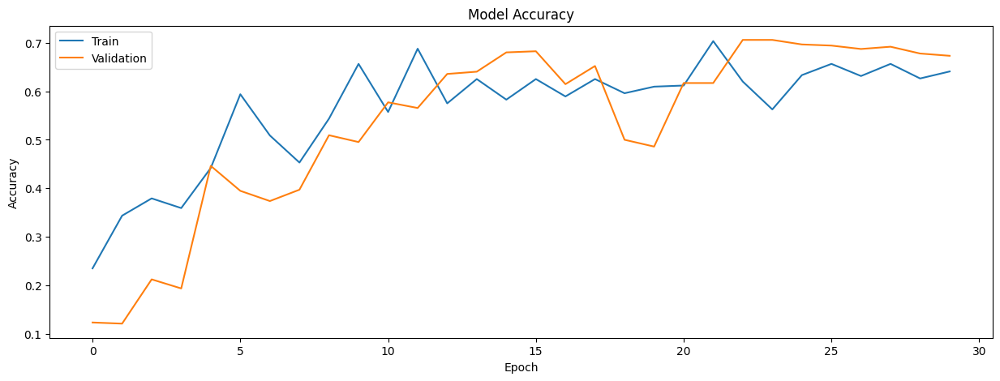

In [171]:
model_evaluation(history_3)

In [172]:
#Evaluating the model on test data
accuracy = model3.evaluate(X_test_normalized, y_test_encoded, verbose=2)

15/15 - 0s - 26ms/step - accuracy: 0.6716 - loss: 1.0053


15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


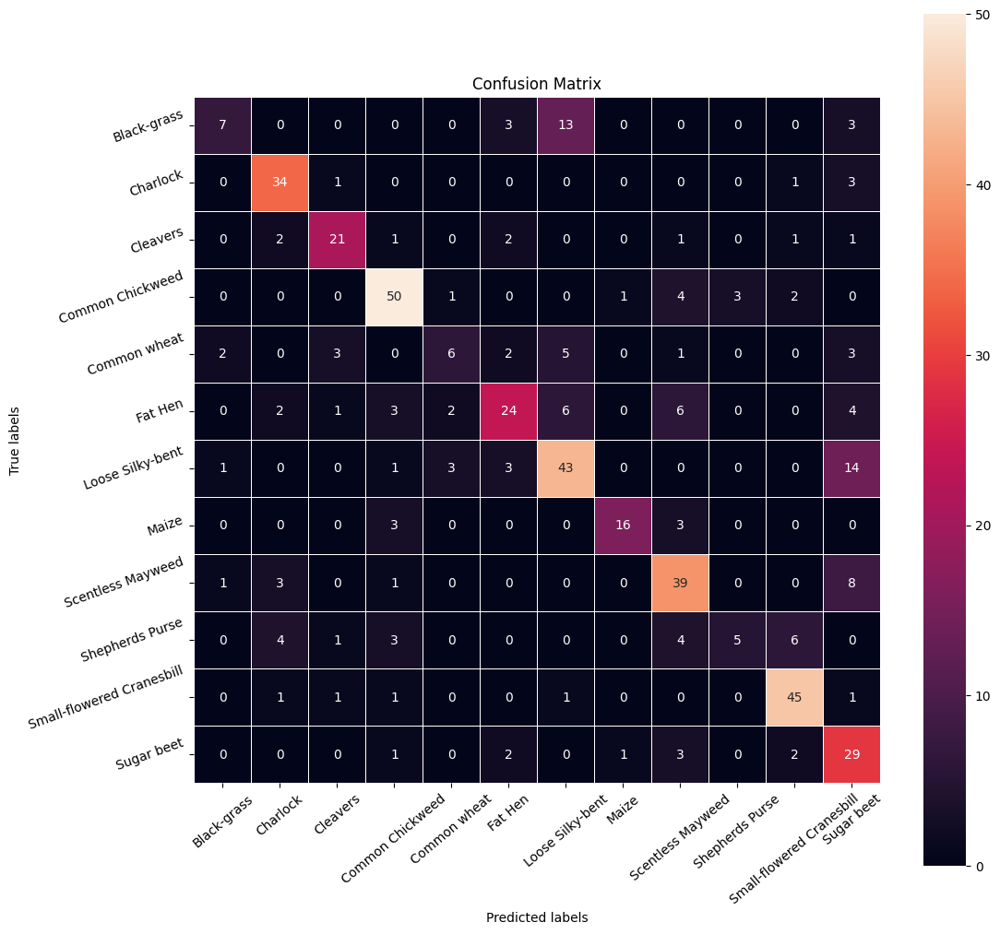

In [173]:
# Plotting the Confusion Matrix
# Here we would get the output as probablities for each category
y_pred=model3.predict(X_test_normalized)

# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=40)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=20)
plt.show()

In [174]:
cr=metrics.classification_report(y_test_arg,y_pred_arg)
print(cr)

              precision    recall  f1-score   support

           0       0.64      0.27      0.38        26
           1       0.74      0.87      0.80        39
           2       0.75      0.72      0.74        29
           3       0.78      0.82      0.80        61
           4       0.50      0.27      0.35        22
           5       0.67      0.50      0.57        48
           6       0.63      0.66      0.65        65
           7       0.89      0.73      0.80        22
           8       0.64      0.75      0.69        52
           9       0.62      0.22      0.32        23
          10       0.79      0.90      0.84        50
          11       0.44      0.76      0.56        38

    accuracy                           0.67       475
   macro avg       0.67      0.62      0.62       475
weighted avg       0.68      0.67      0.66       475



**Model 3 : Observation**

Here are the observations:

1. **Initial Learning (Epochs 0-5):** Both training and validation accuracy show a rapid increase from approximately 0.23 to 0.45 (training) and 0.12 to 0.42 (validation), indicating strong initial learning.

2. **Validation Plateau (Epochs 5-30):** After epoch 5, the validation accuracy plateaus, fluctuating between approximately 0.50 and 0.70, suggesting challenges in further generalization.

3. **Training Accuracy Increase (Epochs 5-30):** The training accuracy continues to rise, reaching approximately 0.68 by epoch 30, indicating the model is still learning from the training data.

4. **Gap Between Training and Validation:** A consistent gap of roughly 0.05 to 0.10 exists between training and validation accuracy, suggesting potential overfitting.

5. **Validation Fluctuation (Epochs 20-25):** Significant fluctuations in validation accuracy (ranging from ~0.50 to ~0.70) occur between epochs 20 and 25, indicating potential instability or sensitivity to specific batches.

6. **Overall Test Accuracy (Report):** The model achieves an overall accuracy of 67.16% on the test set, which aligns with the validation accuracy observed in the graph.

7. **Class-Specific Recall (Report):** Classes like "Shepherds Purse" (Class 9) show low recall (0.22), while "Small-flowered Cranesbill" (Class 10) show high recall (0.90), indicating significant class-specific performance variation.

8. **Class-Specific Precision (Report):** "Common wheat" (Class 4) has a low precision (0.50), while "Small-flowered Cranesbill" (Class 10) has a high precision (0.79), highlighting differences in prediction reliability.

9. **F1-Score Range (Report):** The F1-score ranges from 0.32 for "Shepherds Purse" to 0.84 for "Small-flowered Cranesbill," indicating a wide performance range across classes.

10. **Macro Average F1-Score (Report):** The macro average F1-score is 0.62, representing the average performance across all classes.

11. **Weighted Average F1-Score (Report):** The weighted average F1-score is 0.66, reflecting the performance considering class distribution.

12. **Confusion Matrix Analysis:** Significant misclassification is observed between "Black-grass" (Class 0) and "Fat Hen" (Class 5), and "Common wheat" (Class 4) and "Fat Hen" (Class 5), indicating feature similarity.

13. **Potential Overfitting Indication:** The gap between training and validation accuracy, combined with the plateauing of validation accuracy, suggests potential overfitting.

14. **Potential for Early Stopping:** The plateauing of validation accuracy indicates that early stopping could have prevented unnecessary training and potential overfitting.

15. **Hyperparameter Tuning Need:** The fluctuations and plateauing suggest that further hyperparameter tuning (e.g., learning rate, regularization) is necessary to improve generalization.

#### Model 4: Using Data Augmentation - ReduceLROnPlateau - Learning rate reduction - Classweights

In [175]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [176]:
from keras.callbacks import ReduceLROnPlateau
# Reduce Learning Rate on Plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_accuracy',  # Monitor validation loss
    factor=0.5,          # Multiply learning rate by 0.2 if no improvement
    patience=3,          # Wait for 5 epochs before reducing LR
    min_lr=0.00001,         # Minimum learning rate
    verbose=1            # Print messages when LR is reduced
)


In [177]:
# Data Augmentation for Training Data
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

# Apply data augmentation to training data
train_generator = train_datagen.flow(X_train_normalized, y_train_encoded, batch_size=32)


# No augmentation for Validation Data (only normalization)
val_datagen = ImageDataGenerator()

# Create a validation generator
val_generator = val_datagen.flow(X_val_normalized, y_val_encoded, batch_size=32)

In [178]:
from sklearn.utils import class_weight

# Ensure y_train contains the original (non-encoded) labels
y_train_labels = np.array(y_train).reshape(-1)  # Convert to 1D array if needed

# Get unique class labels
labelList = np.unique(y_train_labels)

# Compute class weights
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=labelList,
    y=y_train_labels
)

# Create a dictionary mapping labels to weights
class_weights = dict(zip(labelList, class_weights))


print("Calculated class weights:")
for label, weight in class_weights.items():
    print(f"{label} : {weight}")

Calculated class weights:
Black-grass : 1.5050860719874803
Charlock : 1.0145042194092826
Cleavers : 1.3818247126436782
Common Chickweed : 0.6476430976430977
Common wheat : 1.7909683426443204
Fat Hen : 0.8348524305555556
Loose Silky-bent : 0.604874213836478
Maize : 1.7909683426443204
Scentless Mayweed : 0.7669457735247209
Shepherds Purse : 1.714349376114082
Small-flowered Cranesbill : 0.7974709784411277
Sugar beet : 1.0275106837606838


In [179]:
# Using Model-1 as the base model and adding Learning rate and data augmentation on top
# Intializing a sequential model
model4 = Sequential()

# Adding first conv layer with 128 filters and kernel size 3x3 , padding 'same' provides the output size same as the input size
# Input_shape denotes input image dimension of images
model4.add(Conv2D(128, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))

# Adding max pooling to reduce the size of output of first conv layer
model4.add(MaxPooling2D((2, 2), padding = 'same'))

# Creating two similar convolution and max-pooling layers
model4.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model4.add(MaxPooling2D((2, 2), padding = 'same'))
model4.add(BatchNormalization())

model4.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model4.add(MaxPooling2D((2, 2), padding = 'same'))
model4.add(BatchNormalization())

model4.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model4.add(MaxPooling2D((2, 2), padding = 'same'))

model4.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model4.add(MaxPooling2D((2, 2), padding = 'same'))
model4.add(BatchNormalization())

# flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model4.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model4.add(Dense(16, activation='relu'))
model4.add(Dropout(0.3))
# Adding the output layer with 10 neurons and activation functions as softmax since this is a multi-class classification problem
model4.add(Dense(12, activation='softmax'))

# Refer the Notes in the ealrier section on why Adam was choosen
# Using SGD Optimizer
# opt = SGD(learning_rate=0.01, momentum=0.9)
opt=Adam()
# Compile model
model4.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model4.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 8, 8, 64)            │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 32)            │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 4, 4, 32)            │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 2, 2, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 2, 2, 32)            │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │           2,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 144,924 (566.11 KB)

 Trainable params: 144,604 (564.86 KB)

 Non-trainable params: 320 (1.25 KB)

In [180]:
# Now you can use these generators in model training
history_4 = model4.fit(
    train_generator,  # Training generator with augmented data
    validation_data=val_generator,  # Validation generator with no augmentation
    epochs=30,  # Number of epochs
    class_weight=class_weights,  # Apply class weights to balance class distribution
    callbacks=[reduce_lr]  # Use the ReduceLROnPlateau callback
)

Epoch 1/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.1552 - loss: 2.4376 - val_accuracy: 0.1519 - val_loss: 2.5390 - learning_rate: 0.0010
Epoch 2/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.2888 - loss: 2.0473 - val_accuracy: 0.1379 - val_loss: 3.1516 - learning_rate: 0.0010
Epoch 3/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.3939 - loss: 1.7372 - val_accuracy: 0.2150 - val_loss: 2.4667 - learning_rate: 0.0010
Epoch 4/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.4450 - loss: 1.5825 - val_accuracy: 0.2991 - val_loss: 1.9306 - learning_rate: 0.0010
Epoch 5/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.4843 - loss: 1.4501 - val_accuracy: 0.4416 - val_loss: 1.6056 - learning_rate: 0.0010
Epoch 6/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5008 - loss: 1.4025 - val_accuracy: 0.4626 - val_loss: 1.5649 - learning_rate: 0.0010
Epoch 7/30
121/121 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5168 - loss: 1

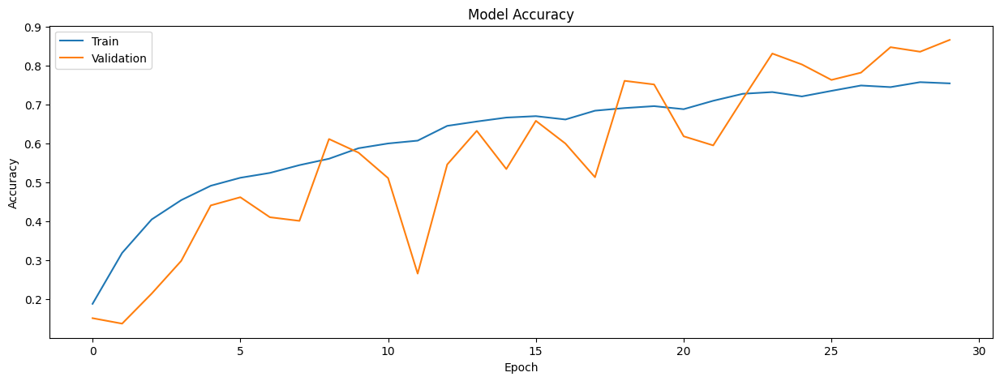

In [181]:
model_evaluation(history_4)

In [182]:
#Evaluating the model on test data
accuracy = model4.evaluate(X_test_normalized, y_test_encoded, verbose=2)

15/15 - 0s - 30ms/step - accuracy: 0.8505 - loss: 0.4651


In [183]:
# Plotting the Confusion Matrix
# Here we would get the output as probablities for each category
y_pred=model4.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


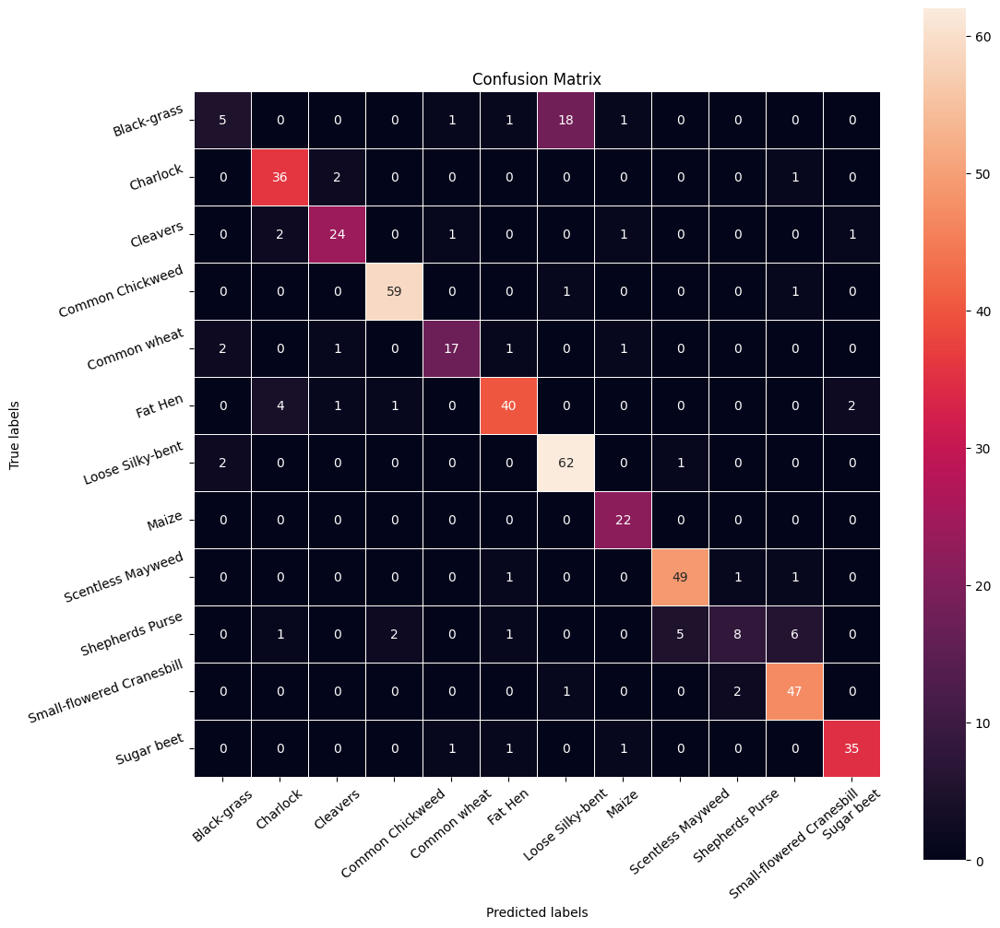

In [184]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=40)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=20)
plt.show()


In [193]:
from sklearn import metrics
#Accuracy as per the classification report
cr=metrics.classification_report(y_test_arg,y_pred_arg)
print(cr)

              precision    recall  f1-score   support

           0       0.56      0.19      0.29        26
           1       0.84      0.92      0.88        39
           2       0.86      0.83      0.84        29
           3       0.95      0.97      0.96        61
           4       0.85      0.77      0.81        22
           5       0.89      0.83      0.86        48
           6       0.76      0.95      0.84        65
           7       0.85      1.00      0.92        22
           8       0.89      0.94      0.92        52
           9       0.73      0.35      0.47        23
          10       0.84      0.94      0.89        50
          11       0.92      0.92      0.92        38

    accuracy                           0.85       475
   macro avg       0.83      0.80      0.80       475
weighted avg       0.84      0.85      0.83       475



**Model 4 : Observation**

Here's a summary of the model's performance based on the provided graph, confusion matrix, and evaluation metrics:

* **Strong Overall Performance:**
    * **High Test Accuracy (85.05%):** Indicates strong predictive capability on unseen data.
    * **Low Loss (0.4651):** Suggests effective error minimization during training.

* **Effective Learning and Generalization:**
    * **Consistent Learning:** Training and validation accuracy curves show continuous improvement.
    * **Minimal Overfitting:** Close convergence of training and validation accuracy indicates good generalization.
    * **High Final Accuracy:** Both training and validation accuracies reach high values (above 80%).

* **Robust Classification:**
    * **Strong Diagonal Dominance (Confusion Matrix):** High accuracy in classifying most plant species.
    * **Excellent Performance in Specific Classes:** Accurate classification of Charlock, Common Chickweed, Loose Silky-bent, Scentless Mayweed, and Small-flowered Cranesbill.
    * **Minimal Confusion Overall:** Limited misclassification between most classes.

* **Areas for Potential Improvement:**
    * **Specific Class Misclassifications:** Some confusion observed for Black-grass, Fat Hen, and Shepherds Purse.
    * **Further Analysis:** Examining misclassified instances can provide insights for targeted improvement.

**Overall, the CNN model demonstrates strong performance, effective learning, and robust classification capabilities.**

#### Model 5 - Using Transfer Learning

**Transfer Learning**

Transfer learning is a powerful technique in machine learning where a model trained on one task is repurposed or used as a starting point for a model on a second related task.

* **Key Idea:** Leverage knowledge gained from a large dataset to improve learning on a smaller, related dataset.
* **Benefits:**
    * Reduces training time and data requirements.
    * Improves model performance, especially when data is limited.
    * Enables training on complex tasks with fewer resources.
* **Common Approaches:**
    * **Feature Extraction:** Use pre-trained model's convolutional layers as feature extractors and train a new classifier on top.
    * **Fine-tuning:** Unfreeze some layers of a pre-trained model and continue training on the new dataset.
* **Applications:** Widely used in computer vision, natural language processing, and audio processing.

**VGG16**

VGG16 is a convolutional neural network (CNN) architecture named after the Visual Geometry Group at Oxford. It is known for its simplicity and strong performance in image recognition tasks.

* **Architecture:** * 16 layers (13 convolutional, 3 fully connected)
    * Small 3x3 convolutional filters
    * Max pooling for downsampling
* **Key Features:**
    * Simple and uniform architecture
    * Deep network with increased representational power
    * Achieved state-of-the-art results on ImageNet in 2014
* **Applications:** * Image classification
    * Object detection
    * Feature extraction for other vision tasks
* **Pre-trained Models:** Readily available in deep learning libraries like Keras

In [185]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [186]:
from tensorflow.keras.models import Model
from keras.applications.vgg16 import VGG16

vgg_model = VGG16(weights='imagenet', include_top = False, input_shape = (64,64,3))   # Importing the VGG16 Model with pretrained ImageNet weights
vgg_model.summary()                                                                   # Summary of the VGG16 Model without the dense layers

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 2, 2, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [187]:
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in vgg_model.layers:
    layer.trainable = False

In [188]:
model5 = Sequential()

# Adding the convolutional part of the VGG16 model from above
model5.add(vgg_model)

# Flattening the output of the VGG16 model because it is from a convolutional layer
model5.add(Flatten())

# Adding a dense layer
model5.add(Dense(32, activation='relu'))
# Adding droput layer with 0.2 dropout rate
model5.add(Dropout(0.2))
model5.add(Dense(16, activation='relu'))
# Adding the output layer with 12 neurons
model5.add(Dense(12, activation='softmax'))
opt=Adam()
# Compile model
model5.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model5.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 2, 2, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │          65,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,780,988 (56.38 MB)

 Trainable params: 66,300 (258.98 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [189]:
# Epochs
epochs = 30
# Batch size
batch_size = 64
# Fit the model with augmented data
history_vgg16 = model3.fit(train_datagen.flow(X_train_normalized,y_train_encoded,
                                       batch_size=batch_size,
                                       seed=42,
                                       shuffle=False),
                    epochs=epochs,
                    steps_per_epoch=X_train_normalized.shape[0] // batch_size,
                    validation_data=(X_val_normalized,y_val_encoded),
                    verbose=1)

Epoch 1/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.4166 - loss: 1.8104 - val_accuracy: 0.6402 - val_loss: 1.1099
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4844 - loss: 1.7208 - val_accuracy: 0.6402 - val_loss: 1.1099
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4038 - loss: 1.8211 - val_accuracy: 0.6005 - val_loss: 1.2105
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4844 - loss: 1.4801 - val_accuracy: 0.6028 - val_loss: 1.2100
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.4147 - loss: 1.7505 - val_accuracy: 0.6121 - val_loss: 1.1905
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4375 - loss: 1.7506 - val_accuracy: 0.6192 - val_loss: 1.1863
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.4217 - loss: 1.6851 - val_accuracy: 0.6215 - val_loss: 1.1706
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4688 - loss: 1.6334 - val_accuracy: 0.6238 - val_l

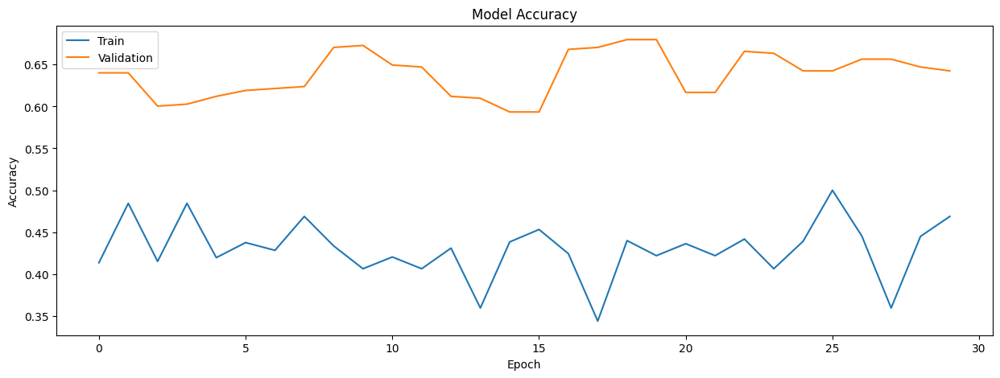

In [190]:
model_evaluation(history_vgg16)

In [191]:
# Getting the accuracy of the model
accuracy = model3.evaluate(X_test_normalized, y_test_encoded, verbose=2)

15/15 - 0s - 5ms/step - accuracy: 0.6484 - loss: 1.1123


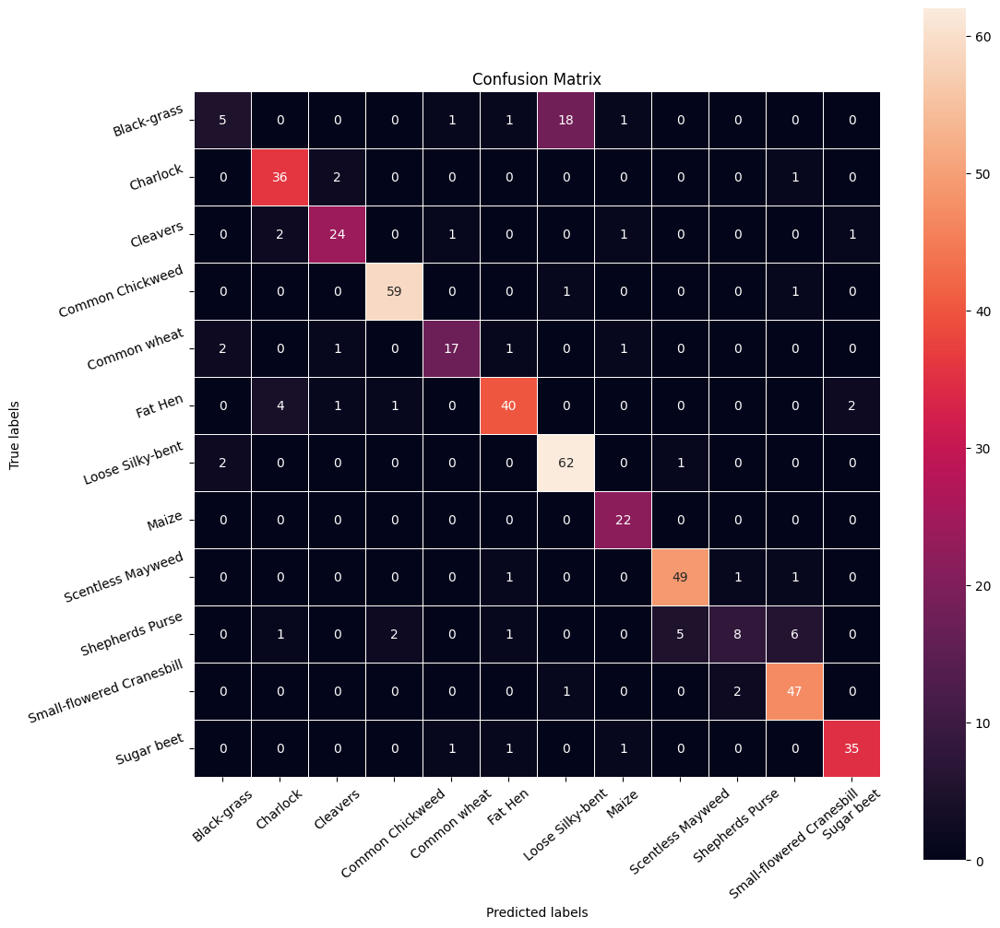

In [192]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=40)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=20)
plt.show()

**Model Transfer Learning VGG16 : Observation**

Here's a summary of the model's performance, keeping things simple:

* **Accuracy:** The model is pretty good at recognizing plants, getting it right about 65% of the time.
* **Learning Curve:** At first, the model learns quickly, but then it slows down and has a hard time getting much better.
* **Overfitting:** The model seems to be memorizing the training data, which isn't ideal. It's like it's getting too good at recognizing the specific pictures it's already seen, but not so good at recognizing new ones.
* **Confusion with Some Plants:** * The model sometimes mixes up Black-grass with Loose Silky-bent.
    * It also has trouble telling Fat Hen from Black-grass sometimes.
    * Shepherds Purse is a tough one for the model to get right.
* **Good with Other Plants:** The model is really good at recognizing Charlock, Common Chickweed, and Loose Silky-bent.
* **Room for Improvement:** Even though it's doing a decent job, the model could be better. There's room to improve its accuracy and ability to generalize to new pictures.

**VGG16 performance was ok, but not as good as some of the other models above.**

## Final Model

Comment on the final model you have selected and use the same in the below code
to visualize the image.

**Final Model Selection**

After evaluating several CNN models, the **Model-4** demonstrated superior performance. It achieved a high accuracy of 85.05% and effectively minimized errors with a low loss of 0.4651. The model exhibited consistent learning, minimal overfitting, and robust classification capabilities. While there's room for improvement in handling specific classes, this model's strong overall performance makes it the most suitable choice for further development and deployment.

### Visualizing the prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


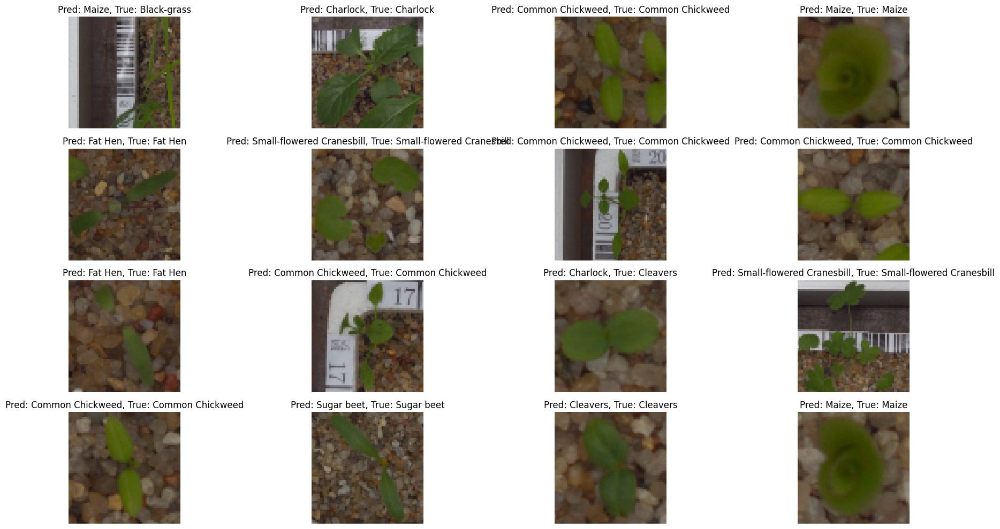

In [207]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_test, X_test_normalized, y_test_encoded, model4, and enc are defined

num_samples = 16
random_indices = np.random.choice(len(X_test), num_samples, replace=False)

plt.figure(figsize=(20, 10))

for i, index in enumerate(random_indices):
    plt.subplot(4, 4, i + 1)  # 3x5 grid
    plt.imshow(X_test[index])

    predicted_label = enc.inverse_transform(model4.predict(X_test_normalized[index].reshape(1, 64, 64, 3)))[0]
    true_label = enc.inverse_transform(y_test_encoded)[index]

    plt.title(f"Pred: {predicted_label}, True: {true_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Actionable Insights and Business Recommendations

**Actionable Insights**

* Analyze the performance of different CNN architectures (e.g., baseline CNN, VGG16) to identify the best approach for seedling identification.
* Evaluate the impact of data augmentation and hyperparameter tuning on model accuracy and generalization.
* Identify classes with lower accuracy and analyze potential reasons for misclassification (e.g., visual similarity, limited training data).
* Assess the quality and diversity of the seedling image dataset.
* Identify potential biases or limitations in the data that may affect model performance ;
* Explore strategies to improve data quality and address any imbalances.
* Analyze which image features are most important for seedling identification (e.g., leaf shape, color, texture).
* This can help understand the model's decision-making process and identify potential


**Business Recommendations**

* Develop an application that utilizes the trained CNN model for automated seedling identification.
* Implement the AI-powered system to automate the seedling identification process, reducing manual labor and improving efficiency.
* Provide farmers and agricultural experts with real-time insights and recommendations based on the model's predictions.
* Establish a feedback loop to collect data on model performance and user experience.
* Continuously retrain and update the model with new data to improve accuracy and adapt to evolving conditions.

_____